このジュピターノートブックは人間の認知処におけるセンサ入力と言語的でない特徴量の低次ー中等ー高次段階抽出とそれらの統合（チャンキング）をComputer Vision codeを使って理解するためのコードです。


＊＊コード自体はAI支援を受けながら、認知授業のキーワードでコードして、デバッグしたものです。


１．ヘッダパート：ライブラリ（計算モジュール）のインストールと関連ファイルのダウンロード。

open-cvは標準的な画像処理系ライブラリ。

mediapipeはCNNベースの画像処理ライブラリ。

In [ ]:
!pip install  opencv-python
!pip install mediapipe
!wget -O efficientdet_lite0.tflite -q https://storage.googleapis.com/mediapipe-models/object_detector/efficientdet_lite0/float32/1/efficientdet_lite0.tflite
!wget -O pose_landmarker.task -q https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_full/float16/1/pose_landmarker_full.task
!wget -O face_landmarker.task -q https://storage.googleapis.com/mediapipe-models/face_landmarker/face_landmarker/float16/1/face_landmarker.task
!wget -O face_detector.tflite -q https://storage.googleapis.com/mediapipe-models/face_detector/blaze_face_short_range/float16/1/blaze_face_short_range.tflite
!wget -O haarcascade_frontalface_default.xml https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.4/11.4 MB 122.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 16.1 MB/s eta 0:00:00
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.4.0
    Uninstalling absl-py-1.4.0:
      Successfully uninstalled absl-py-1.4.0
--2026-04-05 08:45:52--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.03s   

2026-04-05 08:45:52 (32.3 MB/s) - ‘haarcascade_frontalface_default.xml’ saved [930127/930127]



２．コードのヘッダライブラリの組み込み行・初期化

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from google.colab import files
from IPython.display import display, Image
import math

In [ ]:
# MediaPipe Object Detector を初期化
base_options = python.BaseOptions(model_asset_path='efficientdet_lite0.tflite')
options = vision.ObjectDetectorOptions(base_options=base_options, score_threshold=0.5)
detector = vision.ObjectDetector.create_from_options(options)


３．目におけるデータの取得のシミュレーション。神経細胞的事実から実際に目が受け取る画像の生成。

実行時にファイル選択ボタンでローカルから好きな画像を選択してください。
結果は画像で出力されます。

シミュレートされた画像の赤い点は視点の位置となります。そこから視野角でシミュレートしています。内部的に変更することも可能です。

画像をアップロードしてください...


Saving Gemini_Generated_Image_.png to Gemini_Generated_Image_.png


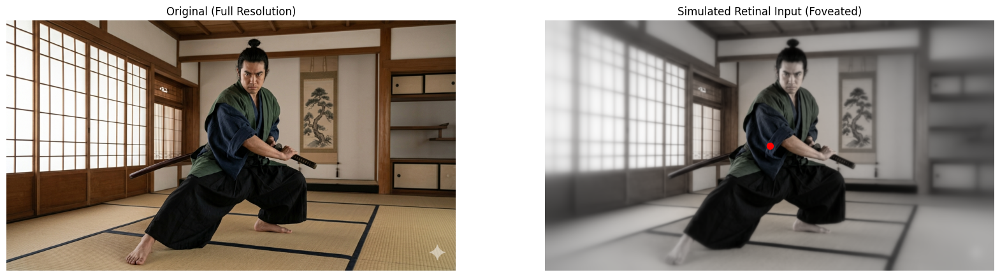

In [ ]:
def apply_retinal_sim(img, fovea_x, fovea_y):
    # --- 1. 元画像のHSV変換 ---
    hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    h_h, h_w = img.shape[:2]

    # 距離マップの作成
    y, x = np.ogrid[:h_h, :h_w]
    dist_map = np.sqrt((x - fovea_x)**2 + (y - fovea_y)**2)

    # 正規化距離 (0〜1)
    max_dist = np.sqrt(h_h**2 + h_w**2)
    norm_dist = dist_map / max_dist

    # --- 2. 彩度（S）チャンネルの操作 ---
    # 錐体密度分布（対数的）に近い形で、中心から離れるほど彩度をゼロに近づける
    # expの係数を大きくすると、モノクロエリアが中心近くまで広がります
    saturation_decay = np.exp(-norm_dist * 8)

    # Sチャンネルに掛ける（0〜255の範囲にクリップ）
    hsv_img[:, :, 1] = np.clip(hsv_img[:, :, 1] * saturation_decay, 0, 255).astype(np.uint8)

    # 彩度を落とした画像をRGBに戻す（これがベース画像になる）
    img_desaturated = cv2.cvtColor(hsv_img, cv2.COLOR_HSV2RGB)

    # --- 3. 多重解像度合成（ボケ処理） ---
    # ここからは元のロジックと同じですが、入力画像を img_desaturated に変更します
    stack_count = 12
    output = np.zeros_like(img, dtype=np.float32)
    weight_sum = np.zeros((h_h, h_w, 1), dtype=np.float32)

    # 画像ピラミッドを事前生成して、大きなぼかしの計算コストを削減
    pyramid_levels = [img_desaturated.astype(np.float32)]
    current_pyramid_img = img_desaturated.astype(np.float32)

    # 複数のダウンサンプルレベルを生成
    # 例えば、元画像、1/2、1/4、1/8、1/16の解像度
    for _ in range(4): # 最大4レベルのダウンサンプルを生成
        if current_pyramid_img.shape[0] > 10 and current_pyramid_img.shape[1] > 10: # 極端に小さい画像にならないように
            current_pyramid_img = cv2.pyrDown(current_pyramid_img)
            pyramid_levels.append(current_pyramid_img)
        else:
            break

    for i in range(stack_count):
        sigma = (2**i) / 2 if i > 0 else 0

        # シグマ値に基づいて、使用するピラミッドレベルを決定
        pyramid_level_idx = 0
        if sigma > 2 and len(pyramid_levels) > 1: # シグマが大きくなったら、ダウンサンプル画像を使用
            # シグマ値に応じて適切なピラミッドレベルを選択するヒューリスティック
            # 例: sigma=4で1レベルダウン、sigma=8で2レベルダウンなど
            pyramid_level_idx = min(len(pyramid_levels) - 1, int(np.log2(max(1, sigma / 2))))

        source_img_for_blur = pyramid_levels[pyramid_level_idx]

        # 現在のピラミッドレベルの解像度に合わせてシグマ値を調整
        adjusted_sigma = sigma / (2**pyramid_level_idx)
        if adjusted_sigma < 1:
            adjusted_sigma = 0.5 # 0はぼかしなし、小さな値でわずかにぼかす

        if adjusted_sigma == 0:
            blurred_layer_ds = source_img_for_blur
        else:
            blurred_layer_ds = cv2.GaussianBlur(source_img_for_blur, (0, 0), adjusted_sigma).astype(np.float32)

        # ダウンサンプルされた画像を使った場合、元のサイズにアップサンプル
        if pyramid_level_idx > 0:
            layer = cv2.resize(blurred_layer_ds, (h_w, h_h), interpolation=cv2.INTER_LINEAR)
        else:
            layer = blurred_layer_ds

        # 距離に応じたレイヤー選択のマスク
        target_dist = i / stack_count
        mask = np.exp(-((norm_dist - target_dist)**2) / 0.01)
        mask = mask[:, :, np.newaxis]

        output += layer * mask
        weight_sum += mask

    return (output / (weight_sum + 1e-5)).astype(np.uint8)

# --- 実行セクション ---
print("画像をアップロードしてください...")
uploaded = files.upload()

for filename in uploaded.keys():
    # 画像読み込み
    input_img = cv2.imdecode(np.frombuffer(uploaded[filename], np.uint8), cv2.IMREAD_COLOR)
    input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)

    h, w = input_img.shape[:2]
    # 注視点を中央に設定（ここを変えると見え方が変わります）
    center_x, center_y = w // 2, h // 2

    # シミュレーション実行
    retina_img = apply_retinal_sim(input_img, center_x, center_y)

    # 表示
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.title("Original (Full Resolution)")
    plt.imshow(input_img)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Simulated Retinal Input (Foveated)")
    plt.imshow(retina_img)
    plt.scatter([center_x], [center_y], c='red', s=50, label='Gaze Point') # 注視点
    plt.axis('off')

    plt.show()

４．低次特徴量の計算

ここではopencvの関数で計算をしている。内部的には画像の2階微分をフィルタと畳み込み（コンボリューション：CNNのC）で実装している。

詳しい原理はマーによるvisionか、openCVのドキュメントを読むと良い

設計：目的：画像の強度の変化の大きい点の抽出

　　　数理：２階微分による0点抽出（人間）

　　　設計：フィルタの構造・サイズ（人間）

　　　分類：特にしない。


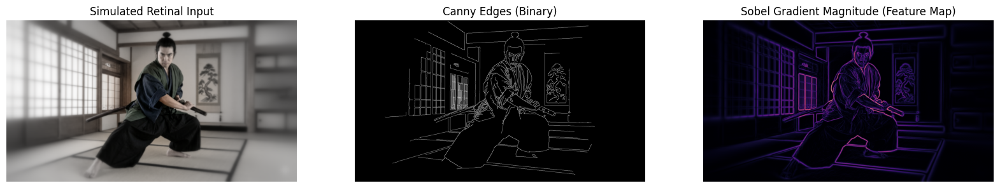

In [ ]:
def detect_retinal_edges(simulated_img):
    # 1. グレースケール化（エッジ検出の標準的な前処理）
    gray = cv2.cvtColor(simulated_img, cv2.COLOR_RGB2GRAY)

    # 2. Canny法によるエッジ検出
    # 低解像度（周辺）では勾配が緩やかなため、閾値を調整することで
    # 「中心の鋭いエッジ」と「周辺のぼやけたエッジ」の差を可視化できます
    edges_canny = cv2.Canny(gray, threshold1=30, threshold2=100)

    # 3. Sobelフィルタ（勾配強度）
    # より「脳内の特徴量マップ」に近い、エッジの「強さ」を可視化
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    grad_mag = np.sqrt(grad_x**2 + grad_y**2)
    grad_mag = np.uint8(np.absolute(grad_mag) * 255 / np.max(grad_mag))

    return edges_canny, grad_mag

# --- 実行と表示セクション ---
# retina_img は前のシミュレーション結果の変数
edges, grad_map = detect_retinal_edges(retina_img)

plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.title("Simulated Retinal Input")
plt.imshow(retina_img)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Canny Edges (Binary)")
plt.imshow(edges, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Sobel Gradient Magnitude (Feature Map)")
plt.imshow(grad_map, cmap='magma')
plt.axis('off')

plt.show()

４.中程度特徴量への統合（hough)

輪郭の点を使って全て、統計投票的に形状を抽出するアルゴリズム

line:線は切片と傾き座標に投票していき、長い線程投票量が多いことを利用

circle:中心x、yと半径座標で行う。安定性は悪い

設計：目的：点群の低次特徴量を形状図形に統合

　　　数理：特徴量（傾き、切片）座標への投票とピーク探査（人間）

　　　設計：座標、形状の選択、探索アルゴリズム（人間）

　　　分類：ピーク探索（設計量）

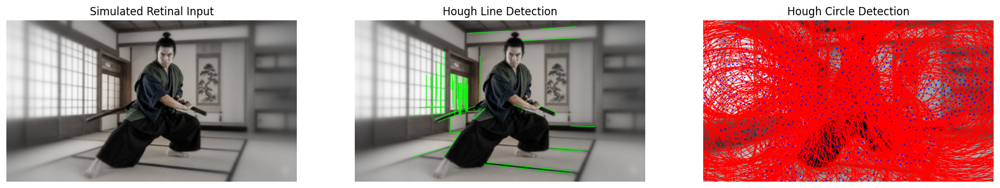

In [ ]:
def detect_hough_features(simulated_img):
    # グレースケール化
    gray = cv2.cvtColor(simulated_img, cv2.COLOR_RGB2GRAY)

    # 1. Hough直線変換
    # Cannyエッジ検出を事前に適用
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=100, minLineLength=50, maxLineGap=10)

    line_img = simulated_img.copy()
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(line_img, (x1, y1), (x2, y2), (0, 255, 0), 2) # 緑色の線

    # 2. Hough円変換
    # メディアンブラーを適用してノイズを減らす（円検出には重要）
    blurred_gray = cv2.medianBlur(gray, 5)
    # dp: 解像度の逆数, minDist: 円の中心間の最小距離
    # param1: Cannyエッジ検出の上位閾値, param2: 中心を検出するためのアキュムレータ閾値
    circles = cv2.HoughCircles(blurred_gray, cv2.HOUGH_GRADIENT, dp=1, minDist=20,
                               param1=50, param2=30, minRadius=0, maxRadius=0)

    circle_img = simulated_img.copy()
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            # 円周を描画
            cv2.circle(circle_img, (i[0], i[1]), i[2], (255, 0, 0), 2) # 青色の円
            # 中心を描画
            cv2.circle(circle_img, (i[0], i[1]), 2, (0, 0, 255), 3) # 赤色の中心

    return line_img, circle_img

# --- 実行と表示セクション ---
# retina_img は前のシミュレーション結果の変数
line_img_hough, circle_img_hough = detect_hough_features(retina_img)

plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.title("Simulated Retinal Input")
plt.imshow(retina_img)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Hough Line Detection")
plt.imshow(line_img_hough)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Hough Circle Detection")
plt.imshow(circle_img_hough)
plt.axis('off')

plt.show()

５．高次特徴量抽出（Hog＋SVM）

人間の位置という高次の統合特徴量抽出手法、Hog特徴～houghに近い概念とSVMで実装されている。

設計：目的：人間という高次特徴量の場所設計

　　　設計：特徴量の収集方法（Hog）（人間）

　　　分類：機械学習（SVM）（学習）

＊＊学習セットに結果がかなり依存する。

＊＊この資料の途中のHarrもHarr特徴+Adaboost(ML)手法

Detected 1 people in original image.
Detected 4 people in simulated retinal image.


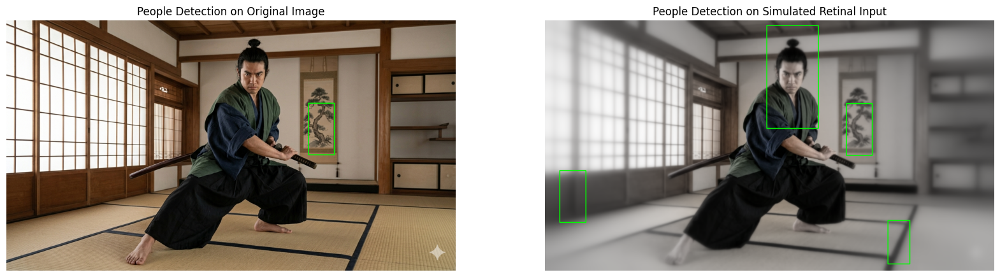

In [ ]:
def detect_people_hog(img):
    # HOGDescriptorの初期化
    hog = cv2.HOGDescriptor()
    hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

    # HOG検出器を用いて人物を検出
    # winStride: 検出窓が画像をスライドするステップサイズ
    # padding: 検出窓の周りに付加されるパディング
    # scale: 画像スケールの増分比率 (小さいほど多くのスケールで検出)
    (rects, weights) = hog.detectMultiScale(img, winStride=(4, 4), padding=(8, 8), scale=1.05)

    # 検出された人物にバウンディングボックスを描画
    img_with_boxes = img.copy()
    for (x, y, w, h) in rects:
        cv2.rectangle(img_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2) # 緑色の矩形

    return img_with_boxes, rects

# --- 実行と表示セクション ---
# retina_img は前のシミュレーション結果の変数

# 元の画像に対してHOG検出
img_with_people_boxes_original, detected_rects_original = detect_people_hog(input_img)
# シミュレーション後の画像に対してHOG検出
img_with_people_boxes_retina, detected_rects_retina = detect_people_hog(retina_img)

print(f"Detected {len(detected_rects_original)} people in original image.")
print(f"Detected {len(detected_rects_retina)} people in simulated retinal image.")

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("People Detection on Original Image")
plt.imshow(img_with_people_boxes_original)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("People Detection on Simulated Retinal Input")
plt.imshow(img_with_people_boxes_retina)
plt.axis('off')

plt.show()

６．高次特徴量抽出：Neural Network:end to end 学習分類器

画像系のCNNツールのmediapipe利用の人体の場所検出

Object tracking 手法の応用例

設計：目的：人間という高次特徴量の抽出

　　　設計：NNノードのパイプライン設計（人間）

　　　特徴量：畳み込みネットワークとして計算（学習）

　　　分類：プーリング・全結合層で計算（学習）

### MediaPipeによるオブジェクト検出 (特に人物)

ここでは、MediaPipeの事前学習済みモデルを使用して、元の画像と網膜シミュレーション後の画像の両方でオブジェクト（主に人物）を検出します。

**注意点:** 現在のMediaPipeの汎用オブジェクト検出モデル（EfficientDet-Lite）は、「絵画」のような特定の芸術作品を直接検出するクラスは持っていません。主に「人物」やその他の一般的なオブジェクト（猫、犬、車など）を検出します。

In [ ]:
def detect_objects_and_draw(image, detector):
    # OpenCV (BGR) -> MediaPipe (RGB)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=image_rgb)

    # オブジェクト検出を実行
    detection_result = detector.detect(mp_image)

    # 結果を描画する画像を作成
    annotated_image = image_rgb.copy()

    # 検出されたオブジェクトを描画
    for detection in detection_result.detections:
        bbox = detection.bounding_box
        category = detection.categories[0]
        category_name = category.category_name
        score = round(category.score, 2)

        # ユーザーのリクエストに応じて「人」だけを検出する
        if category_name == 'person': # ここでフィルタリング
            # バウンディングボックスの座標
            start_point = (bbox.origin_x, bbox.origin_y)
            end_point = (bbox.origin_x + bbox.width, bbox.origin_y + bbox.height)

            # バウンディングボックスを描画
            cv2.rectangle(annotated_image, start_point, end_point, (0, 255, 0), 2) # 緑色

            # ラベルとスコアを描画
            label = f'{category_name} ({score})'
            cv2.putText(annotated_image, label, (bbox.origin_x, bbox.origin_y - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    return annotated_image, detection_result


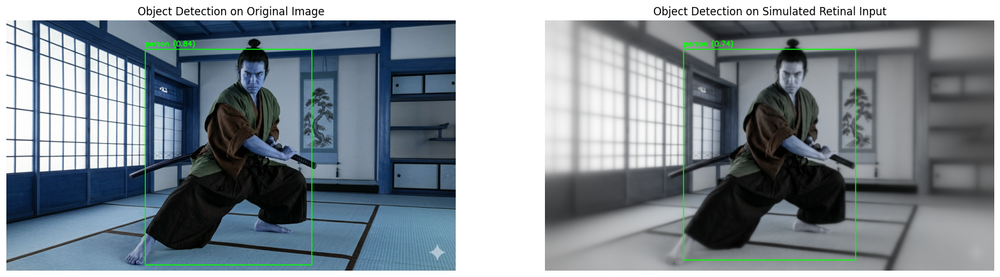

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from google.colab import files
from IPython.display import display, Image
import math

# 元の画像でオブジェクト検出を実行
annotated_original_img_data, _ = detect_objects_and_draw(input_img, detector)

# シミュレーション画像でオブジェクト検出を実行
annotated_retina_img_data, _ = detect_objects_and_draw(retina_img, detector)

# 結果の表示
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Object Detection on Original Image")
plt.imshow(annotated_original_img_data)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Object Detection on Simulated Retinal Input")
plt.imshow(annotated_retina_img_data)
plt.axis('off')

plt.show()

分析：どちらも人体の領域を”確からしさ＝confidential score”付きで計算可能。高解像度画像の方がCSが高い。

クロップした画像の表示

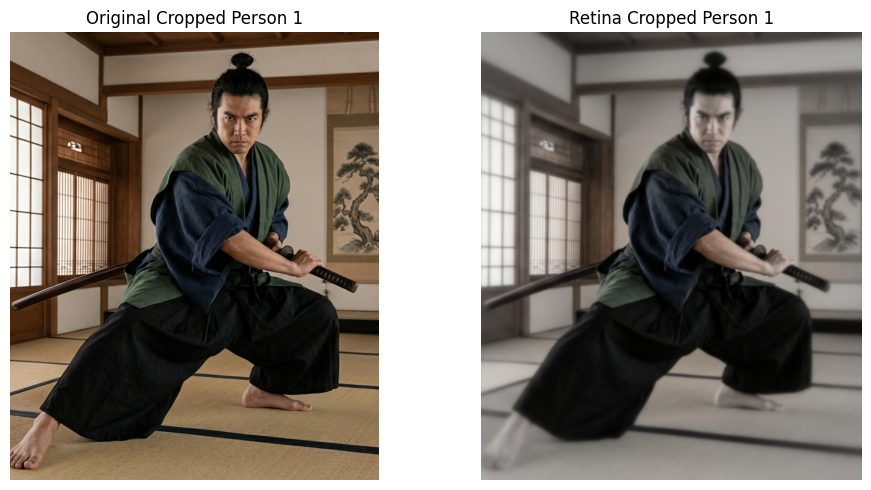

In [ ]:
def crop_image_to_person_bbox(image, detection_result, person_index=0, padding=0.1):
    """
    MediaPipeの検出結果から指定された人物のバウンディングボックスに基づいて画像をクロップする関数。
    :param image: 入力画像 (NumPy array)
    :param detection_result: MediaPipe ObjectDetectorの検出結果
    :param person_index: クロップする人物のインデックス (デフォルトは最初の人物)
    :param padding: バウンディングボックスに追加するパディング (割合、例: 0.1で10%)
    :return: クロップされた画像 (NumPy array) またはNone
    """
    if not detection_result.detections:
        return None

    person_bboxes = []
    for detection in detection_result.detections:
        if detection.categories[0].category_name == 'person':
            person_bboxes.append(detection.bounding_box)

    if not person_bboxes or person_index >= len(person_bboxes):
        print(f"No person detected or person_index {person_index} is out of bounds.")
        return None

    bbox = person_bboxes[person_index]

    img_h, img_w, _ = image.shape

    # パディングを計算
    pad_x = int(bbox.width * padding)
    pad_y = int(bbox.height * padding)

    # クロップ座標を計算し、画像サイズ内に収める
    x_min = max(0, bbox.origin_x - pad_x)
    y_min = max(0, bbox.origin_y - pad_y)
    x_max = min(img_w, bbox.origin_x + bbox.width + pad_x)
    y_max = min(img_h, bbox.origin_y + bbox.height + pad_y)

    cropped_image = image[y_min:y_max, x_min:x_max]
    return cropped_image

# --- 実行と表示セクション ---

# 元の画像でオブジェクト検出を実行 (検出結果も取得)
# このセルで必要となる検出結果オブジェクトを再度取得します
_, detection_result_original = detect_objects_and_draw(input_img, detector)

# シミュレーション画像でオブジェクト検出を実行 (検出結果も取得)
_, detection_result_retina = detect_objects_and_draw(retina_img, detector)

cropped_original_images = []
cropped_retina_images = []
plot_data = [] # 表示するすべての画像を格納するリスト

# 元の画像から人物をクロップ
if detection_result_original and detection_result_original.detections:
    person_count_original = sum(1 for d in detection_result_original.detections if d.categories[0].category_name == 'person')
    if person_count_original > 0:
        for i in range(person_count_original):
            cropped_person = crop_image_to_person_bbox(input_img, detection_result_original, person_index=i)
            if cropped_person is not None:
                cropped_original_images.append(cropped_person)
                plot_data.append({"title": f"Original Cropped Person {i+1}", "image": cropped_person})
    else:
        plot_data.append({"title": "No person detected in original for cropping", "image": input_img})
else:
    plot_data.append({"title": "No person detected in original for cropping", "image": input_img})


# シミュレーション画像から人物をクロップ
if detection_result_retina and detection_result_retina.detections:
    person_count_retina = sum(1 for d in detection_result_retina.detections if d.categories[0].category_name == 'person')
    if person_count_retina > 0:
        for i in range(person_count_retina):
            cropped_person = crop_image_to_person_bbox(retina_img, detection_result_retina, person_index=i)
            if cropped_person is not None:
                cropped_retina_images.append(cropped_person)
                plot_data.append({"title": f"Retina Cropped Person {i+1}", "image": cropped_person})
    else:
        plot_data.append({"title": "No person detected in retinal for cropping", "image": retina_img})
else:
    plot_data.append({"title": "No person detected in retinal for cropping", "image": retina_img})


# 結果の表示 (統一されたプロットロジック)
if plot_data:
    num_plots = len(plot_data)
    # 最大4列を目指しますが、プロット数に応じて調整
    num_cols = min(num_plots, 4)
    num_rows = math.ceil(num_plots / num_cols)

    plt.figure(figsize=(5 * num_cols, 5 * num_rows))

    for idx, item in enumerate(plot_data):
        plt.subplot(num_rows, num_cols, idx + 1)
        plt.title(item["title"])
        plt.imshow(item["image"])
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No images to display after cropping attempts.")

In [ ]:
# PoseLandmarker setup
base_options = python.BaseOptions(model_asset_path='pose_landmarker.task')
options = vision.PoseLandmarkerOptions(
    base_options=base_options,
    output_segmentation_masks=False # Setting to False for simpler visualization without segmentation
)

# FaceLandmarker setup
face_base_options = python.BaseOptions(model_asset_path='face_landmarker.task')
face_options = vision.FaceLandmarkerOptions(
    base_options=face_base_options,
    num_faces=1, # Detect up to 1 face for simplicity
    output_face_blendshapes=False,
    output_facial_transformation_matrixes=False
)

# Simplified pose connections for drawing (using known indices from MediaPipe Pose solution)
# Indices reference: https://developers.google.com/mediapipe/solutions/vision/pose_landmarker#pose_landmarks_diagram
POSE_CONNECTIONS_CUSTOM = [
    (0, 1), (1, 2), (2, 3), (3, 7), # Face (Nose to left eye landmarks)
    (0, 4), (4, 5), (5, 6), (6, 8), # Face (Nose to right eye landmarks)
    (9, 10), # Mouth
    (11, 12),  # Shoulders
    (11, 13), (13, 15), # Left arm
    (12, 14), (14, 16), # Right arm
    (23, 24),  # Hips
    (23, 25), (25, 27), # Left leg
    (24, 26), (26, 28), # Right leg
    (11, 23), (12, 24)  # Torso
]

def detect_pose_and_draw(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    annotated_image = image_rgb.copy()
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=image_rgb)
    H, W, _ = image_rgb.shape

    with vision.PoseLandmarker.create_from_options(options) as landmarker:
        pose_landmarker_result = landmarker.detect(mp_image)

        if pose_landmarker_result.pose_landmarks:
            for pose_landmarks_list in pose_landmarker_result.pose_landmarks:
                # Draw landmarks as circles
                for landmark in pose_landmarks_list:
                    center_x = int(landmark.x * W)
                    center_y = int(landmark.y * H)
                    cv2.circle(annotated_image, (center_x, center_y), 3, (0, 255, 0), -1) # Green circle

                # Draw simplified connections as lines
                for connection in POSE_CONNECTIONS_CUSTOM:
                    idx1, idx2 = connection
                    if idx1 < len(pose_landmarks_list) and idx2 < len(pose_landmarks_list):
                        lm1 = pose_landmarks_list[idx1]
                        lm2 = pose_landmarks_list[idx2]
                        pt1 = (int(lm1.x * W), int(lm1.y * H))
                        pt2 = (int(lm2.x * W), int(lm2.y * H))
                        cv2.line(annotated_image, pt1, pt2, (255, 0, 0), 2) # Blue line

    return annotated_image


def detect_face_landmarks_and_draw(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    annotated_image = image_rgb.copy()
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=image_rgb)
    H, W, _ = image_rgb.shape

    with vision.FaceLandmarker.create_from_options(face_options) as landmarker:
        face_landmarker_result = landmarker.detect(mp_image)

        if face_landmarker_result.face_landmarks:
            for face_landmarks_list in face_landmarker_result.face_landmarks:
                min_x, max_x = W, 0
                min_y, max_y = H, 0

                # Draw all face landmarks as circles and find min/max coordinates
                for landmark in face_landmarks_list:
                    center_x = int(landmark.x * W)
                    center_y = int(landmark.y * H)
                    cv2.circle(annotated_image, (center_x, center_y), 1, (0, 0, 255), -1) # Red circle

                    min_x = min(min_x, center_x)
                    max_x = max(max_x, center_x)
                    min_y = min(min_y, center_y)
                    max_y = max(max_y, center_y)

                # Draw bounding box around the detected face
                # Add a small padding to the bounding box
                padding_x = int((max_x - min_x) * 0.1)
                padding_y = int((max_y - min_y) * 0.1)
                start_point = (max(0, min_x - padding_x), max(0, min_y - padding_y))
                end_point = (min(W, max_x + padding_x), min(H, max_y + padding_y))
                cv2.rectangle(annotated_image, start_point, end_point, (0, 255, 255), 2) # Yellow rectangle

    return annotated_image

７．高次特徴量：ポーズ推定

mediapipeでポーズ推定

同じくCNNで別の高次特徴量の抽出事例

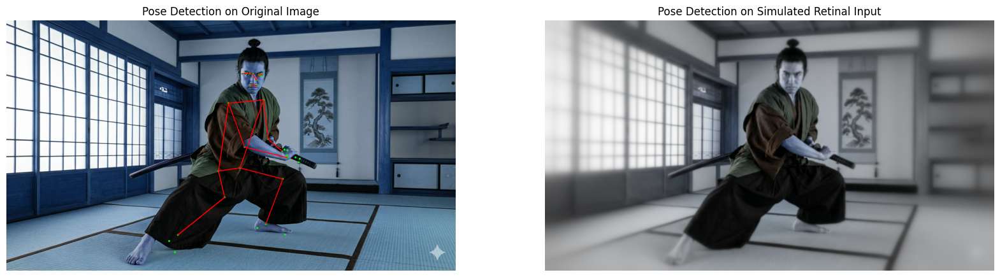

In [ ]:
# 元の画像でポーズ検出を実行
annotated_original_pose_img = detect_pose_and_draw(input_img)

# シミュレーション画像でポーズ検出を実行
annotated_retina_pose_img = detect_pose_and_draw(retina_img)

# 結果の表示
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Pose Detection on Original Image")
plt.imshow(annotated_original_pose_img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Pose Detection on Simulated Retinal Input")
plt.imshow(annotated_retina_pose_img)
plt.axis('off')

plt.show()

分析：侍画像は低解像度では失敗していそう。工夫が必要

工夫：
### MediaPipeによる人物検出とクロッピング

ここでは、前のステップで実行したMediaPipeのオブジェクト検出結果を利用して、検出された人物のバウンディングボックスに基づいて画像をクロップする関数を実装します。これにより、ポーズ検出やフェイシャルランドマーク検出を特定の人物領域に限定して実行できるようになります。

工夫：くロッピングした画像でポーズ推定

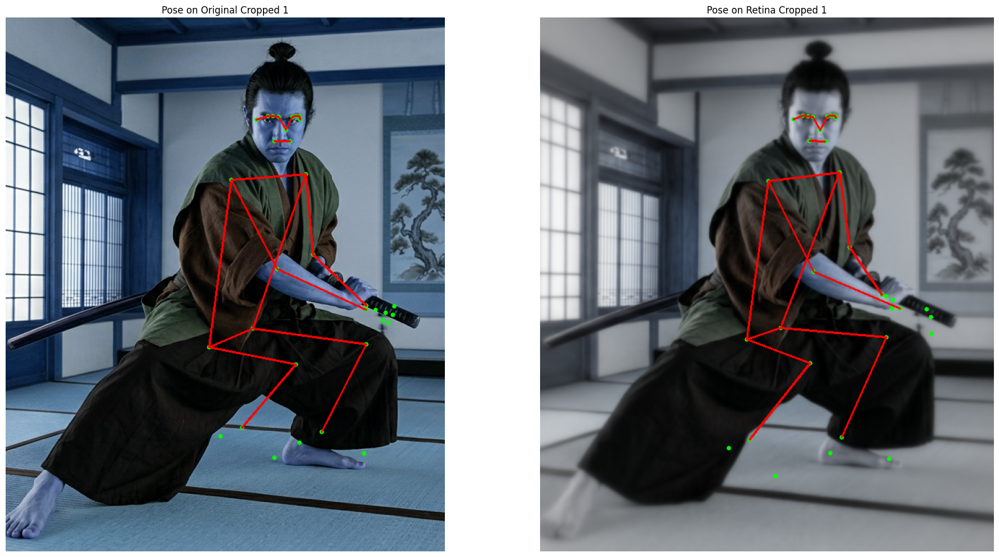

In [ ]:
plt.figure(figsize=(20, 10))

plot_idx = 1
# 元画像からのクロップに対してポーズ検出
if cropped_original_images:
    for i, img in enumerate(cropped_original_images):
        annotated_cropped_pose = detect_pose_and_draw(img)
        plt.subplot(1, len(cropped_original_images) + len(cropped_retina_images), plot_idx)
        plt.title(f"Pose on Original Cropped {i+1}")
        plt.imshow(annotated_cropped_pose)
        plt.axis('off')
        plot_idx += 1

# シミュレーション画像からのクロップに対してポーズ検出
if cropped_retina_images:
    for i, img in enumerate(cropped_retina_images):
        annotated_cropped_pose = detect_pose_and_draw(img)
        plt.subplot(1, len(cropped_original_images) + len(cropped_retina_images), plot_idx)
        plt.title(f"Pose on Retina Cropped {i+1}")
        plt.imshow(annotated_cropped_pose)
        plt.axis('off')
        plot_idx += 1

if not cropped_original_images and not cropped_retina_images:
    print("No cropped images found for pose detection.")

plt.tight_layout()
plt.show()

分析：どちらでも解析できるようになった。

足元のデータはちょっと怪しいかも。学習データ依存。

設計：明示的にパイプラインを組むと向上する場合あり。

８.高次特徴量：フェーシャルランドマーク

顔の表情や視線をデコードする特徴量

mediapipe実装

In [ ]:
# FaceDetector setup
face_detector_base_options = python.BaseOptions(model_asset_path='face_detector.tflite')
face_detector_options = vision.FaceDetectorOptions(base_options=face_detector_base_options, min_detection_confidence=0.3)
face_detector = vision.FaceDetector.create_from_options(face_detector_options)

def crop_to_face(image, detector_instance):
    """
    画像内の顔を検出し、その顔のバウンディングボックスに基づいて画像をクロップする関数。
    """
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=image_rgb)

    detection_result = detector_instance.detect(mp_image)

    if detection_result.detections:
        # 最も確信度の高い顔（最初の検出結果）を使用
        bbox = detection_result.detections[0].bounding_box
        img_h, img_w, _ = image.shape

        # パディングを計算（任意）
        padding_x = int(bbox.width * 0.1)
        padding_y = int(bbox.height * 0.1)

        x_min = max(0, bbox.origin_x - padding_x)
        y_min = max(0, bbox.origin_y - padding_y)
        x_max = min(img_w, bbox.origin_x + bbox.width + padding_x)
        y_max = min(img_h, bbox.origin_y + bbox.height + padding_y)

        cropped_face_img = image[y_min:y_max, x_min:x_max]
        # 元の画像における顔のオフセットを返すと、ランドマークの座標を調整する際に便利
        return cropped_face_img, (x_min, y_min)
    return None, None

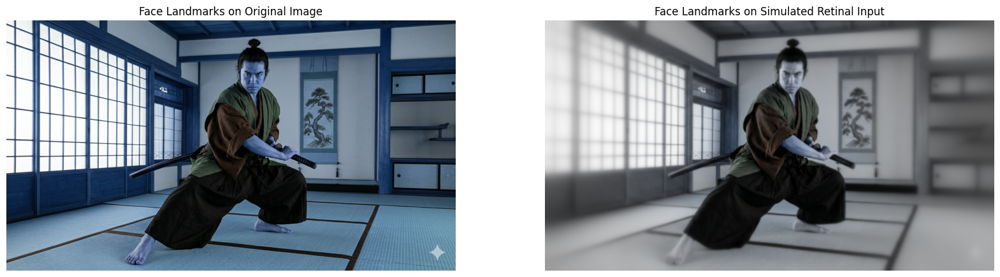

In [ ]:
# 元の画像でフェイシャルランドマーク検出を実行
annotated_original_face_img = detect_face_landmarks_and_draw(input_img)

# シミュレーション画像でフェイシャルランドマーク検出を実行
annotated_retina_face_img = detect_face_landmarks_and_draw(retina_img)

# 結果の表示
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Face Landmarks on Original Image")
plt.imshow(annotated_original_face_img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Face Landmarks on Simulated Retinal Input")
plt.imshow(annotated_retina_face_img)
plt.axis('off')

plt.show()

解析：どちらも失敗　顔のサイズが小さい？

設計：パイプライン＞切り抜き＞ランドマーク

#### ポーズ検出の実行と表示

#### クロップした画像（人物だけ）に対するフェイシャルランドマーク検出の実行と表示

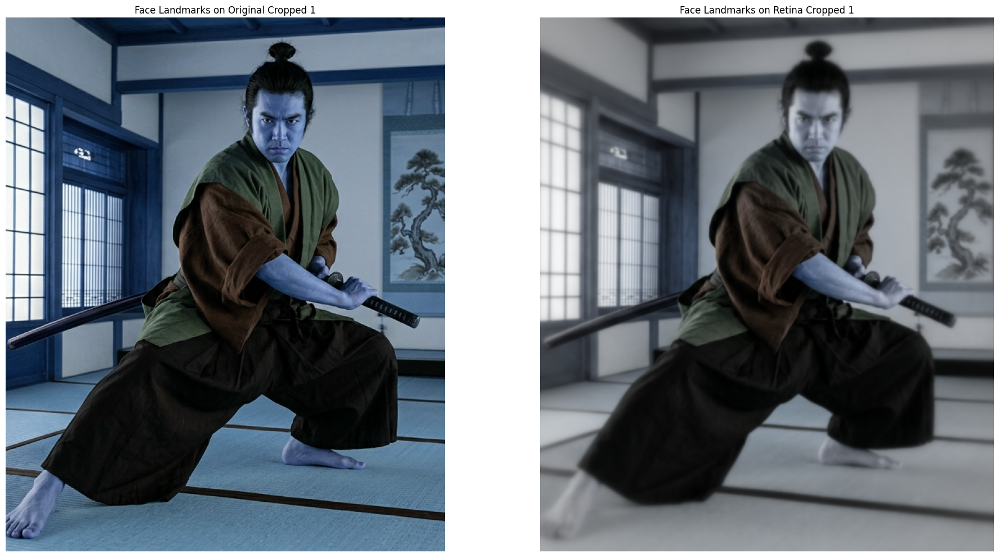

In [ ]:
plt.figure(figsize=(20, 10))

plot_idx = 1
# 元画像からのクロップに対してフェイシャルランドマーク検出
if cropped_original_images:
    for i, img in enumerate(cropped_original_images):
        annotated_cropped_face = detect_face_landmarks_and_draw(img)
        plt.subplot(1, len(cropped_original_images) + len(cropped_retina_images), plot_idx)
        plt.title(f"Face Landmarks on Original Cropped {i+1}")
        plt.imshow(annotated_cropped_face)
        plt.axis('off')
        plot_idx += 1

# シミュレーション画像からのクロップに対してフェイシャルランドマーク検出
if cropped_retina_images:
    for i, img in enumerate(cropped_retina_images):
        annotated_cropped_face = detect_face_landmarks_and_draw(img)
        plt.subplot(1, len(cropped_original_images) + len(cropped_retina_images), plot_idx)
        plt.title(f"Face Landmarks on Retina Cropped {i+1}")
        plt.imshow(annotated_cropped_face)
        plt.axis('off')
        plot_idx += 1

if not cropped_original_images and not cropped_retina_images:
    print("No cropped images found for face landmark detection.")

plt.tight_layout()
plt.show()

失敗

 顔検出＞クロップ＞フェイシャルランドマーク検出の実行と表示

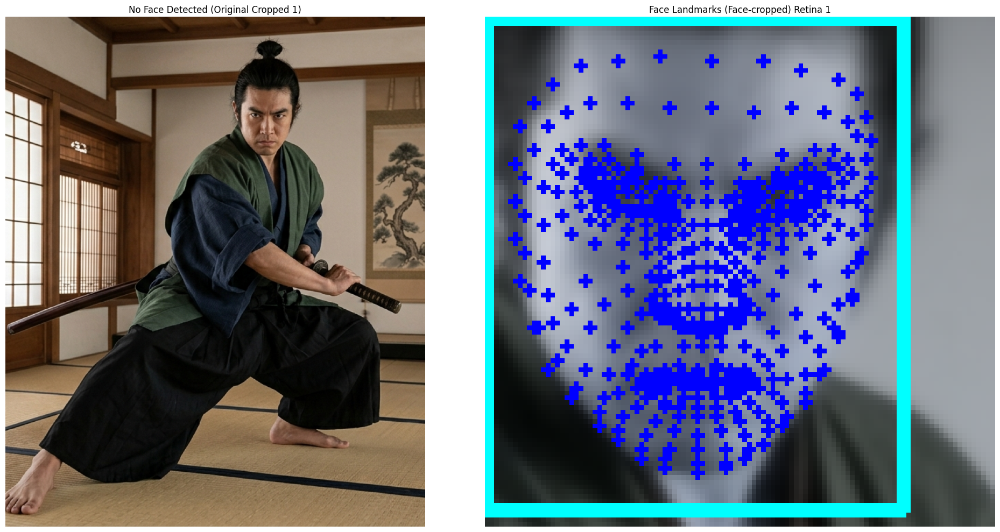

In [ ]:
plt.figure(figsize=(20, 10))

plot_idx = 1

# 元画像からの人物クロップに対して、さらに顔検出でクロップしてからランドマーク検出
if cropped_original_images:
    for i, img in enumerate(cropped_original_images):
        cropped_face_from_original, offset = crop_to_face(img, face_detector)
        if cropped_face_from_original is not None:
            # detect_face_landmarks_and_draw 関数は、入力された画像に対してランドマークを描画するため、
            # ここでクロップした顔画像に直接適用します。
            # 元画像での正確な座標が欲しい場合は、detect_face_landmarks_and_draw を修正してオフセットを考慮させる必要がありますが、
            # 現時点では、クロップされた顔画像内でのランドマーク表示を確認します。
            annotated_cropped_face = detect_face_landmarks_and_draw(cropped_face_from_original)
            plt.subplot(1, len(cropped_original_images) + len(cropped_retina_images), plot_idx)
            plt.title(f"Face Landmarks (Face-cropped) Original {i+1}")
            plt.imshow(annotated_cropped_face)
            plt.axis('off')
            plot_idx += 1
        else:
            # 顔が検出されなかった場合
            plt.subplot(1, len(cropped_original_images) + len(cropped_retina_images), plot_idx)
            plt.title(f"No Face Detected (Original Cropped {i+1})")
            plt.imshow(img)
            plt.axis('off')
            plot_idx += 1

# シミュレーション画像からの人物クロップに対して、さらに顔検出でクロップしてからランドマーク検出
if cropped_retina_images:
    for i, img in enumerate(cropped_retina_images):
        cropped_face_from_retina, offset = crop_to_face(img, face_detector)
        if cropped_face_from_retina is not None:
            annotated_cropped_face = detect_face_landmarks_and_draw(cropped_face_from_retina)
            plt.subplot(1, len(cropped_original_images) + len(cropped_retina_images), plot_idx)
            plt.title(f"Face Landmarks (Face-cropped) Retina {i+1}")
            plt.imshow(annotated_cropped_face)
            plt.axis('off')
            plot_idx += 1
        else:
            # 顔が検出されなかった場合
            plt.subplot(1, len(cropped_original_images) + len(cropped_retina_images), plot_idx)
            plt.title(f"No Face Detected (Retina Cropped {i+1})")
            plt.imshow(img)
            plt.axis('off')
            plot_idx += 1

if not cropped_original_images and not cropped_retina_images:
    print("No cropped images found for face landmark detection after face cropping.")

plt.tight_layout()
plt.show()

解析：mediapipeはなぜか高解像度で顔の位置検出ができない

      mediapipe以外の方法は？

設計：人物（mediapipe)> 顔（harr)>ランドマーク（mediapipe)


In [ ]:
def detect_faces_opencv(image):
    """
    OpenCVのHaar Cascade分類器を使用して画像から顔を検出し、
    検出された顔にバウンディングボックスを描画し、顔のクロップ画像を返す関数。
    """
    face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

    # グレースケールに変換（Haar Cascadeはグレースケールで動作）
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # 顔を検出
    # scaleFactor: 画像スケールの縮小量 (1.1は10%縮小)
    # minNeighbors: 候補矩形を構成する隣接矩形の最小数 (4が一般的)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4, minSize=(30, 30))

    annotated_image = image.copy()
    face_crops = []

    for (x, y, w, h) in faces:
        # 検出された顔に青いバウンディングボックスを描画
        cv2.rectangle(annotated_image, (x, y), (x+w, y+h), (255, 0, 0), 2)

        # 顔領域をクロップ（少しパディングを追加）
        padding = int(0.1 * max(w, h)) # 幅または高さの10%をパディングとして追加
        x_crop = max(0, x - padding)
        y_crop = max(0, y - padding)
        x_max_crop = min(image.shape[1], x + w + padding)
        y_max_crop = min(image.shape[0], y + h + padding)

        cropped_face = image[y_crop:y_max_crop, x_crop:x_max_crop]
        face_crops.append(cropped_face)

    return annotated_image, face_crops

OpenCV Haar Cascade Face Detection on Cropped People Images:


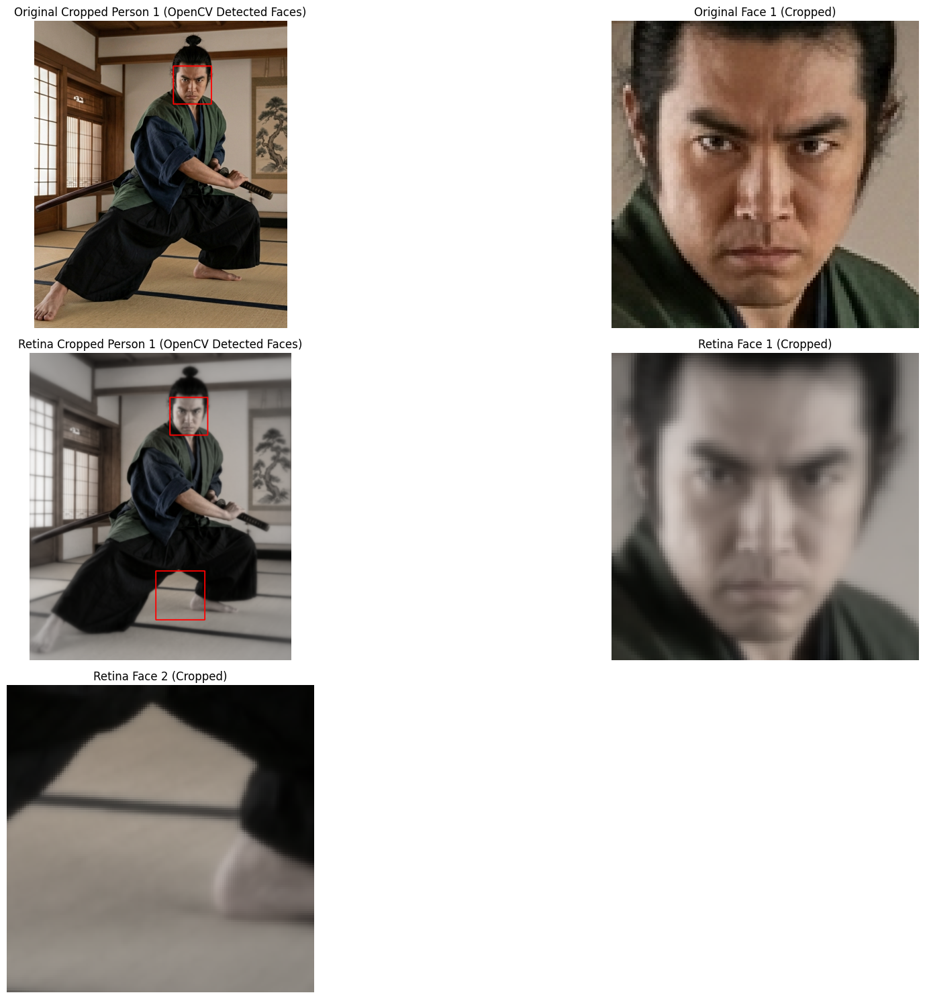

In [ ]:
import math

print("OpenCV Haar Cascade Face Detection on Cropped People Images:")

# Collect all images and their titles to display
all_plots = []

if cropped_original_images:
    for i, img_orig in enumerate(cropped_original_images):
        annotated_img_opencv_orig, detected_faces_opencv_orig = detect_faces_opencv(img_orig)
        all_plots.append({"title": f"Original Cropped Person {i+1} (OpenCV Detected Faces)", "image": annotated_img_opencv_orig})
        if detected_faces_opencv_orig:
            for j, face_img_orig in enumerate(detected_faces_opencv_orig):
                all_plots.append({"title": f"Original Face {j+1} (Cropped)", "image": face_img_orig})
        else:
            all_plots.append({"title": f"No Face Detected in Original Cropped {i+1}", "image": img_orig})

if cropped_retina_images:
    for i, img_retina in enumerate(cropped_retina_images):
        annotated_img_opencv_retina, detected_faces_opencv_retina = detect_faces_opencv(img_retina)
        all_plots.append({"title": f"Retina Cropped Person {i+1} (OpenCV Detected Faces)", "image": annotated_img_opencv_retina})
        if detected_faces_opencv_retina:
            for j, face_img_retina in enumerate(detected_faces_opencv_retina):
                all_plots.append({"title": f"Retina Face {j+1} (Cropped)", "image": face_img_retina})
        else:
            all_plots.append({"title": f"No Face Detected in Retina Cropped {i+1}", "image": img_retina})

num_plots = len(all_plots)
if num_plots == 0:
    print("No cropped images found for OpenCV face detection.")
else:
    num_cols = 2
    num_rows = math.ceil(num_plots / num_cols)

    plt.figure(figsize=(20, 5 * num_rows)) # Adjust figure height dynamically

    for plot_idx, plot_data in enumerate(all_plots):
        plt.subplot(num_rows, num_cols, plot_idx + 1)
        plt.title(plot_data["title"])
        plt.imshow(plot_data["image"])
        plt.axis('off')

    plt.tight_layout()
    plt.show()

#### OpenCVでクロップした顔画像に対するフェイシャルランドマーク検出

<Figure size 2000x1000 with 0 Axes>

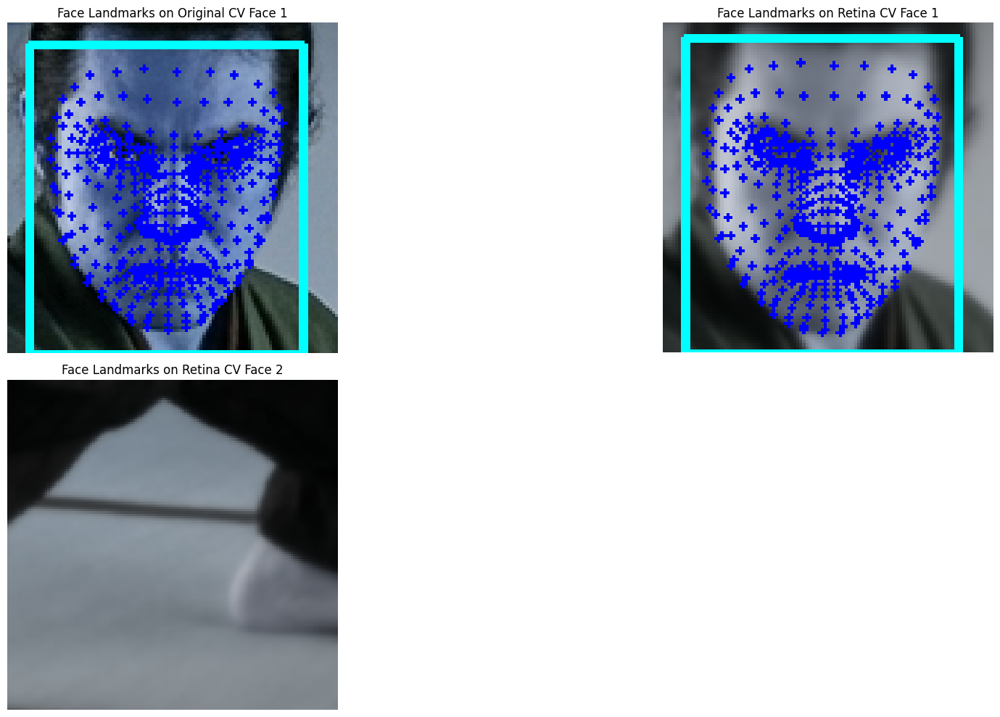

In [ ]:
plt.figure(figsize=(20, 10))

plot_idx = 1
all_cv_face_landmark_plots = []

# 元のクロップされた人物画像から検出されたOpenCV顔画像に対してランドマーク検出
if detected_faces_opencv_orig:
    for i, face_img_orig in enumerate(detected_faces_opencv_orig):
        annotated_cv_face_landmark = detect_face_landmarks_and_draw(face_img_orig)
        all_cv_face_landmark_plots.append({"title": f"Face Landmarks on Original CV Face {i+1}", "image": annotated_cv_face_landmark})

# シミュレーション後のクロップされた人物画像から検出されたOpenCV顔画像に対してランドマーク検出
if detected_faces_opencv_retina:
    for i, face_img_retina in enumerate(detected_faces_opencv_retina):
        annotated_cv_face_landmark = detect_face_landmarks_and_draw(face_img_retina)
        all_cv_face_landmark_plots.append({"title": f"Face Landmarks on Retina CV Face {i+1}", "image": annotated_cv_face_landmark})


num_plots = len(all_cv_face_landmark_plots)
if num_plots == 0:
    print("No OpenCV-cropped face images found for MediaPipe facial landmark detection.")
else:
    num_cols = 2
    num_rows = math.ceil(num_plots / num_cols)

    plt.figure(figsize=(20, 5 * num_rows)) # Adjust figure height dynamically

    for plot_idx, plot_data in enumerate(all_cv_face_landmark_plots):
        plt.subplot(num_rows, num_cols, plot_idx + 1)
        plt.title(plot_data["title"])
        plt.imshow(plot_data["image"])
        plt.axis('off')

    plt.tight_layout()
    plt.show()

分析：Harrで顔抽出成功

　　　抽出画像でランドマーク性交

　　　問題：顔じゃない抽出結果もある。

### 人物検出の比較: MediaPipe vs. HOG (OpenCV)

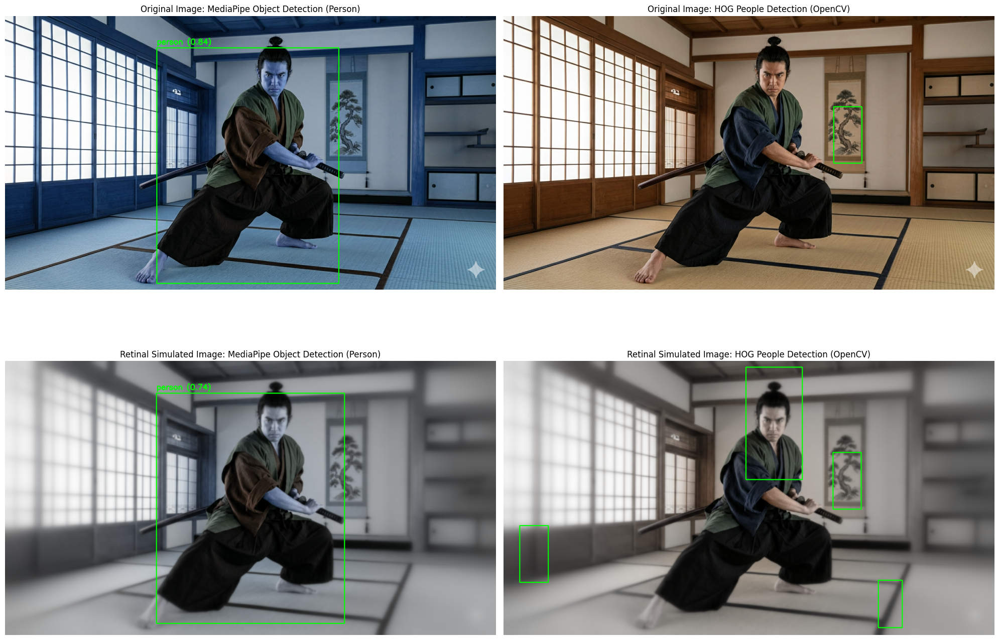

MediaPipe: Detected 1 person(s) in original image.
HOG (OpenCV): Detected 1 person(s) in original image.
MediaPipe: Detected 1 person(s) in simulated retinal image.
HOG (OpenCV): Detected 4 person(s) in simulated retinal image.


In [ ]:
plt.figure(figsize=(20, 15))

# 元画像: MediaPipeによる人物検出
plt.subplot(2, 2, 1)
plt.title("Original Image: MediaPipe Object Detection (Person)")
plt.imshow(annotated_original_img_data)
plt.axis('off')

# 元画像: HOG (OpenCV)による人物検出
plt.subplot(2, 2, 2)
plt.title("Original Image: HOG People Detection (OpenCV)")
plt.imshow(img_with_people_boxes_original)
plt.axis('off')

# 網膜シミュレーション画像: MediaPipeによる人物検出
plt.subplot(2, 2, 3)
plt.title("Retinal Simulated Image: MediaPipe Object Detection (Person)")
plt.imshow(annotated_retina_img_data)
plt.axis('off')

# 網膜シミュレーション画像: HOG (OpenCV)による人物検出
plt.subplot(2, 2, 4)
plt.title("Retinal Simulated Image: HOG People Detection (OpenCV)")
plt.imshow(img_with_people_boxes_retina)
plt.axis('off')

plt.tight_layout()
plt.show()

print(f"MediaPipe: Detected {sum(1 for d in detection_result_original.detections if d.categories[0].category_name == 'person')} person(s) in original image.")
print(f"HOG (OpenCV): Detected {len(detected_rects_original)} person(s) in original image.")
print(f"MediaPipe: Detected {sum(1 for d in detection_result_retina.detections if d.categories[0].category_name == 'person')} person(s) in simulated retinal image.")
print(f"HOG (OpenCV): Detected {len(detected_rects_retina)} person(s) in simulated retinal image.")

### 顔ランドマーク検出の比較: MediaPipe Face Detectorでクロップ vs. OpenCV Haar Cascadeでクロップ

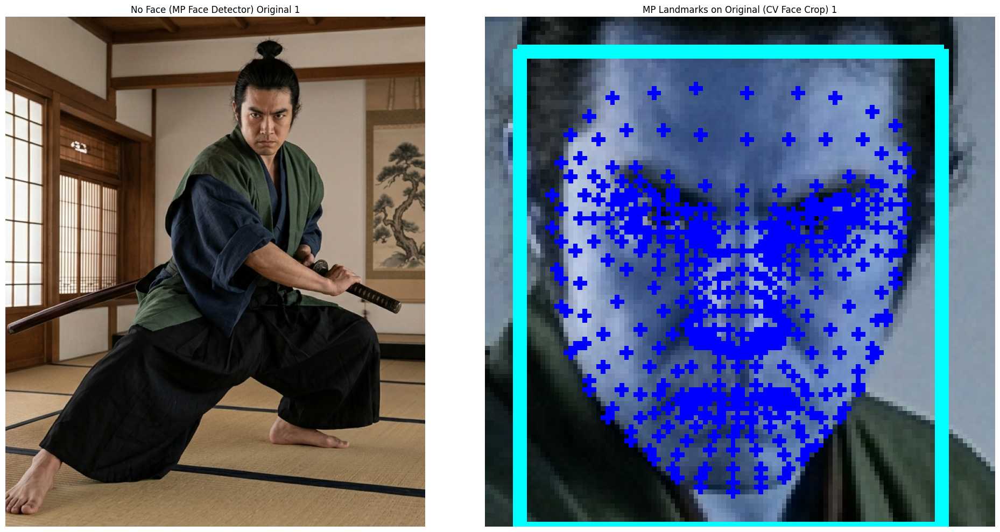

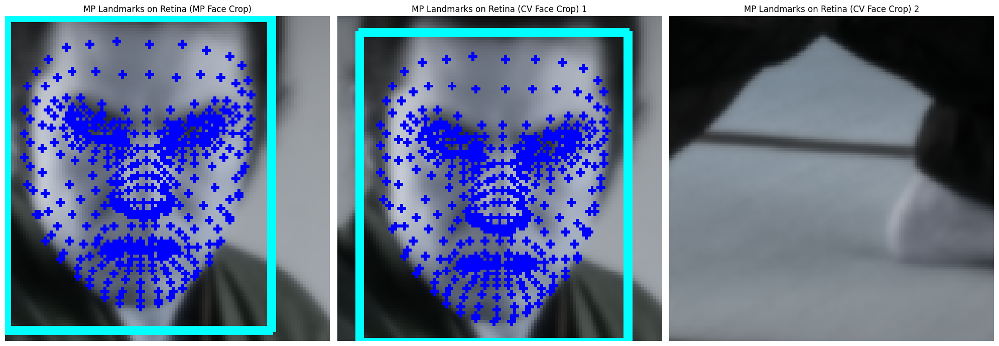

In [ ]:
plt.figure(figsize=(20, 10))

plot_idx = 1

# Calculate dynamic number of columns for the first figure (original images)
num_cols_original_fig = 0
if cropped_original_images:
    for img in cropped_original_images:
        num_cols_original_fig += 1 # For MP Face Crop
        _, detected_faces_opencv_orig_current = detect_faces_opencv(img)
        if detected_faces_opencv_orig_current:
            num_cols_original_fig += len(detected_faces_opencv_orig_current)
        else:
            num_cols_original_fig += 1 # For 'No Face' message

# 元画像からの人物クロップにMediaPipe Face Detectorで顔をクロップし、ランドマーク検出
if cropped_original_images:
    for i, img in enumerate(cropped_original_images):
        cropped_face_from_original_mp, _ = crop_to_face(img, face_detector)
        if cropped_face_from_original_mp is not None:
            annotated_mp_face_landmark_on_mp_crop = detect_face_landmarks_and_draw(cropped_face_from_original_mp)
            plt.subplot(1, num_cols_original_fig, plot_idx)
            plt.title(f"MP Landmarks on Original (MP Face Crop)")
            plt.imshow(annotated_mp_face_landmark_on_mp_crop)
            plt.axis('off')
            plot_idx += 1
        else:
            plt.subplot(1, num_cols_original_fig, plot_idx)
            plt.title(f"No Face (MP Face Detector) Original {i+1}")
            plt.imshow(img)
            plt.axis('off')
            plot_idx += 1

        # 元画像からの人物クロップにOpenCV Haar Cascadeで顔をクロップし、ランドマーク検出
        _, detected_faces_opencv_orig_current = detect_faces_opencv(img)
        if detected_faces_opencv_orig_current:
            for j, face_img_orig in enumerate(detected_faces_opencv_orig_current):
                annotated_mp_face_landmark_on_cv_crop = detect_face_landmarks_and_draw(face_img_orig)
                plt.subplot(1, num_cols_original_fig, plot_idx)
                plt.title(f"MP Landmarks on Original (CV Face Crop) {j+1}")
                plt.imshow(annotated_mp_face_landmark_on_cv_crop)
                plt.axis('off')
                plot_idx += 1
        else:
            plt.subplot(1, num_cols_original_fig, plot_idx)
            plt.title(f"No Face (CV Detector) Original {i+1}")
            plt.imshow(img)
            plt.axis('off')
            plot_idx += 1

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 10))
plot_idx = 1

# Calculate dynamic number of columns for the second figure (retina images)
num_cols_retina_fig = 0
if cropped_retina_images:
    for img in cropped_retina_images:
        num_cols_retina_fig += 1 # For MP Face Crop
        _, detected_faces_opencv_retina_current = detect_faces_opencv(img)
        if detected_faces_opencv_retina_current:
            num_cols_retina_fig += len(detected_faces_opencv_retina_current)
        else:
            num_cols_retina_fig += 1 # For 'No Face' message

# シミュレーション画像からの人物クロップにMediaPipe Face Detectorで顔をクロップし、ランドマーク検出
if cropped_retina_images:
    for i, img in enumerate(cropped_retina_images):
        cropped_face_from_retina_mp, _ = crop_to_face(img, face_detector)
        if cropped_face_from_retina_mp is not None:
            annotated_mp_face_landmark_on_mp_crop = detect_face_landmarks_and_draw(cropped_face_from_retina_mp)
            plt.subplot(1, num_cols_retina_fig, plot_idx)
            plt.title(f"MP Landmarks on Retina (MP Face Crop)")
            plt.imshow(annotated_mp_face_landmark_on_mp_crop)
            plt.axis('off')
            plot_idx += 1
        else:
            plt.subplot(1, num_cols_retina_fig, plot_idx)
            plt.title(f"No Face (MP Face Detector) Retina {i+1}")
            plt.imshow(img)
            plt.axis('off')
            plot_idx += 1

        # シミュレーション画像からの人物クロップにOpenCV Haar Cascadeで顔をクロップし、ランドマーク検出
        _, detected_faces_opencv_retina_current = detect_faces_opencv(img)
        if detected_faces_opencv_retina_current:
            for j, face_img_retina in enumerate(detected_faces_opencv_retina_current):
                annotated_mp_face_landmark_on_cv_crop = detect_face_landmarks_and_draw(face_img_retina)
                plt.subplot(1, num_cols_retina_fig, plot_idx)
                plt.title(f"MP Landmarks on Retina (CV Face Crop) {j+1}")
                plt.imshow(annotated_mp_face_landmark_on_cv_crop)
                plt.axis('off')
                plot_idx += 1
        else:
            plt.subplot(1, num_cols_retina_fig, plot_idx)
            plt.title(f"No Face (CV Detector) Retina {i+1}")
            plt.imshow(img)
            plt.axis('off')
            plot_idx += 1

plt.tight_layout()
plt.show()

まとめ：

認知の低次＞高次へのチャンキングが計算機で実装できる状態を確認できた。

特徴量、分類の設計を人間がするのは分析が容易だけど、エラーが多い、汎用性が比較的小さい。

（opencvにあるライブラリの組み合わせでロバストな画像処理が出来るとも言える）

特徴量は人間、分類は学習のMLハイブリッド手法は人間の手間は減るうえに設計の特徴量については分析可能、高速。但し学習データ依存性も強い

（Scikit-learnで後半部分設計は可能、特徴量は人間設計）

パイプライン（フレームワーク）だけ設計するNNは特徴量、分類共に学習ベースにできる。汎用性、精度共に最上だが、学習データ依存性が強い

あくまでもAIはツールと考えてパイプラインを別経路にすると上手くいくことがある。

メッセージ：AI/codeはツールだが何をしているかを解釈をして使わないと人間の認知情報に何も残らない。

＊＊一応キーワードだけで、組める。

＊＊AI Chatは平均的解答なので、大幅にAPIが変更になった後はドツボにはまる。（mediapipe部分はそれでハマった）
